# Processing Data


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# ruff: noqa: E402
# find the root of the project
import os
from pathlib import Path
import sys
import polars as pl
import dotenv


ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
sys.path.append(str(ROOT))


dotenv.load_dotenv(ROOT.joinpath(".env"))

from src.utils import check_gpu_available

GPU = check_gpu_available()
print(f"GPU available: {GPU}")

/home/max/Development/roadside-radar/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU available: True


## Load the Network


In [3]:
import geopandas as gpd
from src.geometry import RoadNetwork


mainline_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=["EBL1", "WBL1"],
    step_size=0.01,
)

full_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=None,
    step_size=0.01,
)

LANE_WIDTH = 3.55
LANE_NUM = 2

## Read in the Trajectories


In [4]:
from datetime import timedelta
import polars as pl
from src.radar import CalibratedRadar
from src.pipelines.open_file import prep_df


USE_FRONT = False


radar_obj = CalibratedRadar(
    radar_location_path=ROOT / "configuration" / "march_calibrated.yaml",
)

In [5]:
radar_df = (
    pl.scan_parquet(
        # Path(os.environ.get("RAW_DATA_DIR")).joinpath("*.parquet")
        Path("/home/max/Development/ua-traffic-data/tmp/all_working.parquet")
    )
    .with_columns(
        pl.col("epoch_time").dt.replace_time_zone("UTC").dt.round("100ms"),
    )
    # .filter(
    #     pl.col("epoch_time").dt.month().is_in([3])
    #     & pl.col("epoch_time").dt.day().is_in([30, 31])
    #     # & pl.col("epoch_time").dt.hour().is_in([9, 10])
    # )
    .pipe(prep_df, f=radar_obj)
    .filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-03-12 16:40:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-03-12 17:46:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        # & (pl.col("lane").str.contains("W"))
        # & (pl.col("lane_index") == 0)
    )
    .collect()
    .pipe(
        mainline_net.map_to_lane,
        dist_upper_bound=LANE_WIDTH * LANE_NUM
        - (LANE_WIDTH / 2)
        + 0.5,  # centered on one of the lanes,
        utm_x_col="utm_x",
        utm_y_col="utm_y",
    )
    .rename(
        {
            "name": "lane",
            "angle": "heading_lane",
        }
    )
)

function: create_object_id took: 0.0001583099365234375 seconds
function: filter_short_trajectories took: 0.00045013427734375 seconds
function: clip_trajectory_end took: 0.00023865699768066406 seconds
function: resample took: 0.0002548694610595703 seconds
function: fix_duplicate_positions took: 0.00014281272888183594 seconds
function: set_timezone took: 4.57763671875e-05 seconds
function: add_cst_timezone took: 3.0040740966796875e-05 seconds
function: add_heading took: 3.314018249511719e-05 seconds
function: rotate_radars took: 0.00058746337890625 seconds
function: update_origin took: 0.0006046295166015625 seconds


In [6]:
radar_df.lazy().group_by("object_id").agg(
    (pl.col("f32_positionX_m").diff() ** 2 + pl.col("f32_positionY_m").diff() ** 2)
    .sqrt()
    .sum()
    .alias("distance")
).select(pl.col("distance").mean()).collect()

distance
f32
152.163101


In [7]:
radar_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u64,u32


In [8]:
from src.pipelines.kalman_filter import (
    prepare_frenet_measurement,
    build_extension,
    add_timedelta,
    build_kalman_id,
    filter_short_trajectories,
)


prediction_length = 3.5

print(radar_df.shape)

radar_df = \
(
    radar_df.pipe(add_timedelta, vehicle_id_col=["object_id", "lane"])
    .pipe(build_kalman_id, split_time_delta=prediction_length + 0.1)
    .pipe(filter_short_trajectories, minimum_distance_m=5, minimum_duration_s=2)
    .pipe(prepare_frenet_measurement)
    .pipe(build_extension, seconds=prediction_length)
    .pipe(add_timedelta)
    .collect()
    # # .collect()
    # .rechunk()
    # .sort("epoch_time")
    # .with_columns(
    #     pl.count().over(["epoch_time", "object_id"]),
    #     pl.col("epoch_time").cum_count().over(["object_id"]).alias("t_ind"),
    # )
    # .filter(
    #     pl.col("object_id") == pl.col("object_id").filter(pl.col("count") > 1).sample()
    # )
    # # .sort(["kalman_id", "epoch_time", ])
    # # .filter(
    # #     pl.col('kalman_id') == 82586429922632550
    # # )
    # .filter((pl.col('count') > 1) | pl.col('count').shift(-1) > 1)
    # .select(["epoch_time", "kalman_id", "object_id", "count", "prediction", "t_ind", 'missing_data', 'max_time'])
)

print(radar_df.shape)

(1961255, 38)
function: add_timedelta took: 0.0002770423889160156 seconds
function: build_kalman_id took: 0.0003292560577392578 seconds
function: filter_short_trajectories took: 0.00018835067749023438 seconds
function: prepare_frenet_measurement took: 0.0003788471221923828 seconds
function: build_extension took: 2.0408120155334473 seconds
function: add_timedelta took: 0.0001163482666015625 seconds
(1588365, 52)


In [9]:
# id_cols = ("kalman_id",)
# dt: float = 0.1 * 1000  # 100ms
# seconds= 3.5

# (
#     radar_df
#     .lazy()
#     .filter(pl.col("object_id") == pl.col("object_id").sample())
#     .with_columns(pl.count().over("epoch_time"))
#     .collect()
# )

<Axes: xlabel='dist', ylabel='f32_length_m'>

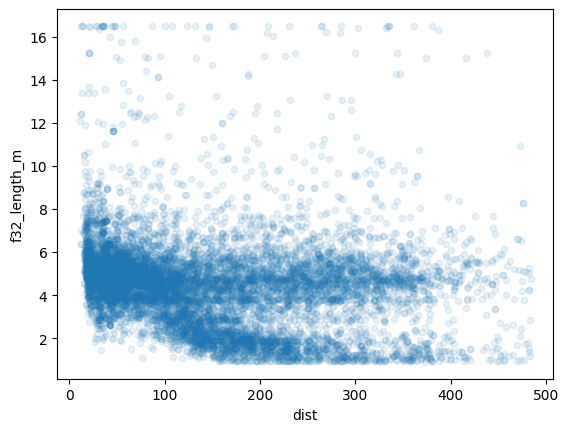

In [10]:
radar_df[["dist", "f32_length_m"]].sample(10_000).to_pandas().plot.scatter(
    x="dist", y="f32_length_m", alpha=0.1
)

<Axes: ylabel='Frequency'>

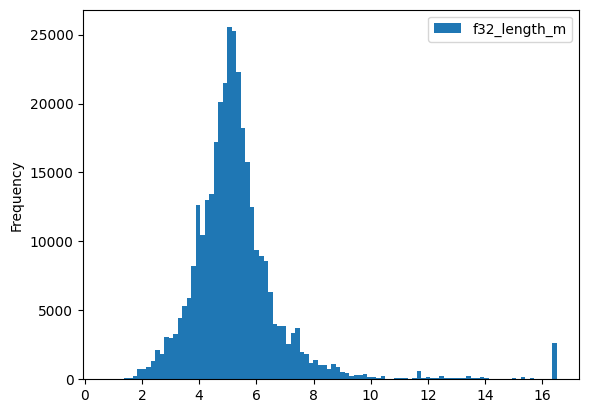

In [11]:
radar_df.filter(pl.col("dist").is_between(10, 50))[
    ["f32_length_m"]
].to_pandas().plot.hist(bins=100)

In [12]:
radar_df.filter(pl.col("dist").is_between(10, 50))[["f32_length_m"]].describe()

describe,f32_length_m
str,f64
"""count""",344486.0
"""null_count""",0.0
"""mean""",5.328463
"""std""",1.751695
"""min""",0.734288
"""25%""",4.470719
"""50%""",5.123281
"""75%""",5.805585
"""max""",16.5


In [13]:
from src.pipelines.kalman_filter import build_kalman_df

filter_df = (
    radar_df
    # .with_columns((pl.col("distanceToFront_s") + pl.col("s")).alias("front_s"))
    .pipe(build_kalman_df, s_col="front_s" if USE_FRONT else "s")
    .filter(
        pl.col("max_time") < pl.col("max_time").max()  # filter out the outlier times
    )
    .collect()
)

function: build_kalman_df took: 0.0005209445953369141 seconds


### IMM Filter the Radar Trajectories


In [14]:
filter_df.group_by("vehicle_ind").agg(pl.col("time_ind").max())["time_ind"].describe(
    percentiles=[0.5, 0.75, 0.9, 0.95, 0.9999]
)

statistic,value
str,f64
"""count""",10047.0
"""null_count""",0.0
"""mean""",156.924256
"""std""",84.104823
"""min""",33.0
"""50%""",142.0
"""75%""",182.0
"""90%""",234.0
"""95%""",282.0


In [15]:
# from src.filters.vectorized_kalman import batch_imm_df, gen_chunks, IMMFilter
# import numpy as np

# chunk_size = 900_000

# tmps = []

# for chunk_df in list(gen_chunks(filter_df.rename({"measurement": "z"}), chunk_size)):
#     # break
#     tmps.append(chunk_df.clone())

#     offset = chunk_df["vehicle_ind"].min()

#     imm = IMMFilter(
#         chunk_df.with_columns(
#             (pl.col("vehicle_ind") - pl.col("vehicle_ind").min()).alias("vehicle_ind")
#         ),
#         filters=("CALC", "CALK", "CVLK"),
#         M=np.array([[0.8, 0.1, 0.1], [0.1, 0.8, 0.1], [0.1, 0.1, 0.8]]),
#         mu=np.array([0.2, 0.2, 0.6]),
#         gpu=GPU,
#     )
#     x_filt, p_filt = imm.apply_filter()
#     mu_filt = imm._mu.cpu().numpy()

#     t_index = np.repeat(np.arange(imm.t_dim), imm.v_dim)
#     # v_index = np.tile(np.arange(imm.v_dim) + , imm.t_dim)
#     # v_index = np.tile(np.arange(imm.v_dim), imm.t_dim) + offset
#     # x_filt = x_filt.reshape(-1, imm.x_dim)
#     # p_filt = p_filt.reshape(-1, imm.x_dim, imm.x_dim)
#     break

# tmp_df = pl.concat(tmps)

In [16]:
# x_filt[chunk_df['time_ind'], chunk_df['vehicle_ind']].shape

In [17]:
# x_filt[:, 0].shape,

In [18]:
from src.filters.vectorized_kalman import batch_imm_df
import numpy as np

filt_df = batch_imm_df(
    filter_df.rename({"measurement": "z"}),
    filters=("CALC", "CALK", "CVLK"),
    M=np.array([[0.8, 0.1, 0.1], [0.1, 0.8, 0.1], [0.1, 0.1, 0.8]]),
    mu=np.array([0.2, 0.2, 0.6]),
    # chunk_size=3_500,
    chunk_size=800 if not GPU else 9_000 * 1000,
    gpu=GPU,
)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:20<00:00, 20.74s/it]


In [19]:
filt_df.shape[0]

1586665

In [20]:
# radar_df.head()

In [21]:
# radar_df_keep_cols = list(
#     set(radar_df.columns) - set(filt_df.columns) - set(filter_df.columns)
# )
# radar_df_keep_cols.sort()

# (
#     filt_df
#     .lazy()
#     .with_columns(pl.col(["time_ind", "vehicle_ind"]).cast(int))
#     .join(
#         filter_df.lazy().with_columns(pl.col(["time_ind", "vehicle_ind"]).cast(int)),
#         on=["time_ind", "vehicle_ind"],
#         how="inner",
#     )
#     .drop(["time_ind", "vehicle_ind"])
#     .join(
#         radar_df.lazy().select(radar_df_keep_cols + ["epoch_time", "kalman_id"]),
#         on=["kalman_id", "epoch_time"],
#         how="left",
#     )
#     .collect(streaming=True)
# )

In [22]:
from src.pipelines.kalman_filter import join_results

joined_df = join_results(filt_df, filter_df, radar_df)

if USE_FRONT:
    joined_df = joined_df.rename({"s": "front_s"})

joined_df = joined_df.collect(streaming=True)

function: join_results took: 0.0007724761962890625 seconds


In [23]:
print(
    "{:3d},{:3d},{:3d}".format(
        joined_df.shape[0], filter_df.shape[0], radar_df.shape[0]
    )
)

1586665,1586665,1588365


In [24]:
radar_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u64,u32


In [25]:
joined_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u64,u32


In [26]:
if "joined_df" not in locals():
    joined_df = pl.read_parquet(
        Path(os.environ.get("RAW_DATA_DIR"))
        / "march_kalman_filter_results"
        / "*/*.parquet",
        use_pyarrow=True,
        memory_map=True,
    )

In [27]:
joined_df = joined_df.lazy().sort("epoch_time").collect(streaming=True).rechunk()

### Tuning the IMM Filter Noise Parameters

In [28]:
# from src.filters.fusion import mahalanobis_distance
# from scipy.stats import chi2

# target = chi2.ppf(0.95, 4)


# test_df = (
#     joined_df.lazy()
#     .with_columns(
#         pl.col(
#             "s",
#             "s_velocity",
#             "d",
#             "d_velocity",
#         )
#         .shift(1)
#         .backward_fill(1)
#         .over("object_id")
#         .name.map(lambda x: x + "_leader"),
#         pl.col("P")
#         .cast(pl.List(inner=pl.Float32))
#         .shift(1)
#         .backward_fill(1)
#         .over("object_id")
#         .cast(joined_df["P"].dtype)
#         .name.map(lambda x: x + "_leader"),
#     )
#     .collect()
#     .pipe(
#         mahalanobis_distance,
#         return_maha=True,
#         pos_override=["s"],
#         gpu=GPU,
#     )
# ).select(["m_sq"])

In [29]:
# (test_df['m_sq'] < target).sum() / len(test_df)

## Plotting the Lanes


In [30]:
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(10, 5))

# joined_df.filter(pl.col("lane").str.contains("W") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

# ax.set_xlim(-5, 6)

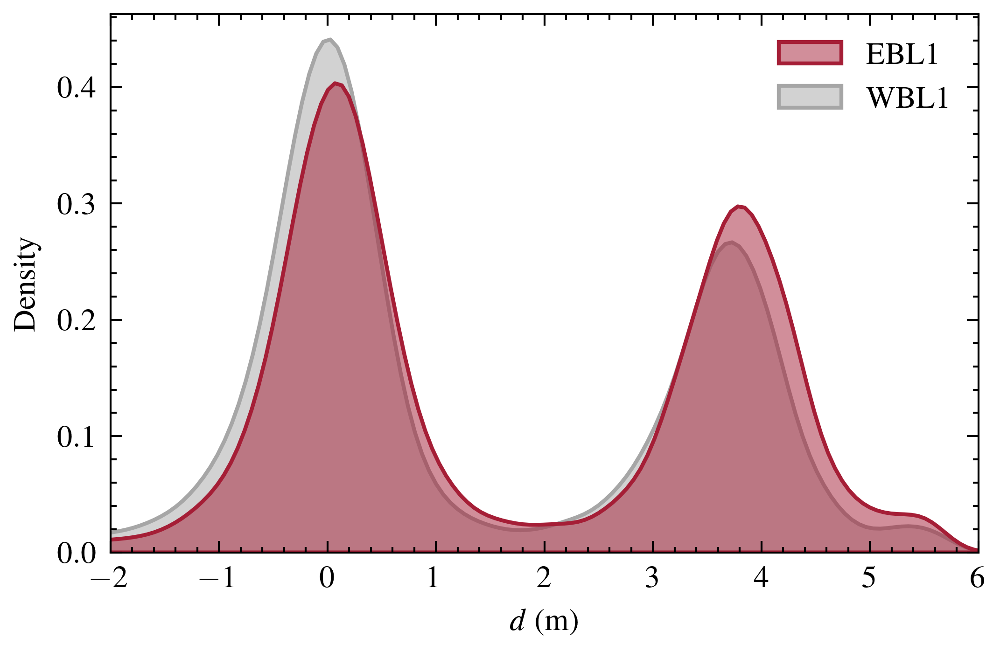

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import scienceplots

engine_color = [0.65, 0.65, 0.65]
gps_color = [0, 0, 0.75]
plutron_color = [0, 0, 0]
alabama = [165, 30, 54]
alabama = [i / 255 for i in alabama]

plt.style.use(["science", "ieee"])

fig, ax = plt.subplots(
    figsize=(4, 2.5),
)

# joined_df.filter(pl.col("lane").str.contains("E") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, )

# create a kde plot of the d dimension in both directions
lane_df = (
    joined_df.select(
        [
            "lane",
            "d",
        ]
    )
    .melt(id_vars="lane", value_name="d")
    .filter(pl.col("d").is_between(-6, 6))
    .sample(1_000_000)
)


lane_df = lane_df.to_pandas()

sns.kdeplot(
    data=lane_df,
    x="d",
    hue="lane",
    fill=True,
    common_norm=False,
    alpha=0.5,
    ax=ax,
    linewidth=1,
    palette=[alabama, engine_color],
)

ax.set_xlim(-2, 6)

ax.set_xlabel("$d$ (m)")
# remove the title of the legend
ax.get_legend().set_title("")

# st th

### Classify the Lanes


In [32]:
from src.pipelines.lane_classification import label_lane, label_lanes_tree
from src.gmm.lane_classification import build_lane_model
from src.plotting.lane_gmm import plot_model

In [33]:
joined_df = joined_df.pipe(
    label_lanes_tree,
    full_network=full_net,
    kalman_network=mainline_net,
    lane_width=LANE_WIDTH,
    s_col="front_s" if USE_FRONT else "s",
)


print(joined_df.filter(pl.col("lane_index").is_null()).shape[0] / joined_df.shape[0])

joined_df = joined_df.with_columns(pl.col("lane_index").fill_null(2))

0.059321911052427574


/tmp/ipykernel_95393/3649221666.py:22: UserWarning: 
The palette list has fewer values (4) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.kdeplot(


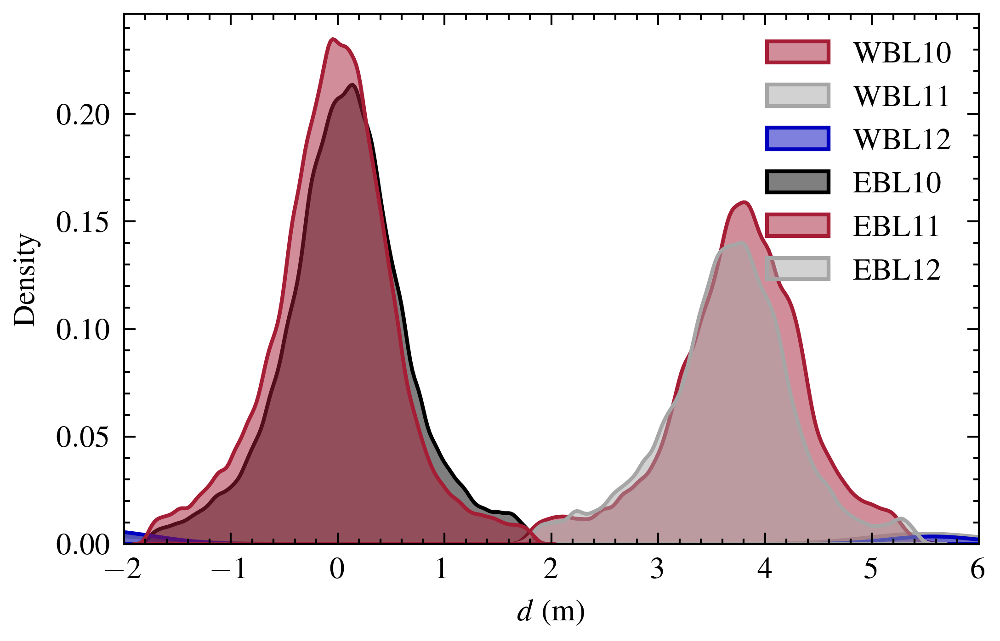

In [34]:
fig, ax = plt.subplots(
    figsize=(4, 2.5),
)

lane_df = (
    joined_df.select(
        [
            pl.concat_str([pl.col("lane"), pl.col("lane_index").cast(str)]).alias(
                "lane"
            ),
            "d",
        ]
    )
    .melt(id_vars="lane", value_name="d")
    .filter(pl.col("d").is_between(-6, 6))
    .sample(1_000_000)
)


lane_df = lane_df.to_pandas()

sns.kdeplot(
    data=lane_df,
    x="d",
    hue="lane",
    fill=True,
    common_norm=True,
    alpha=0.5,
    ax=ax,
    linewidth=1,
    palette=[alabama, engine_color, gps_color, plutron_color],
)

ax.set_xlim(-2, 6)

ax.set_xlabel("$d$ (m)")
# remove the title of the legend
ax.get_legend().set_title("")

# st th

## Save the Kalman Filtered Trajectories

## Merge the Trajectories


#### Things to try:
1. Ignore sublanes
2. Can you do x/y instead of s/d?
3. 

In [35]:
from src.pipelines.association import (
    build_leader_follower_df,
    add_front_back_s,
    build_leader_follower_entire_history_df,
)

joined_df = (
    joined_df
    .lazy()
    .pipe(
        add_front_back_s,
        use_global_median=True,
    )
    .sort(by=["epoch_time"])
    .set_sorted(["epoch_time"])
    .collect(streaming=True)
)

function: add_front_back_s took: 0.00500798225402832 seconds


In [36]:
lf_df = (
    joined_df
    .lazy()
    # .lazy()
    # .pipe(
    #     build_leader_follower_entire_history_df,
    #     s_col="front_s" if USE_FRONT else "s",
    #     use_lane_index=True,
    #     max_s_gap=20,
    # )
    .pipe(
        build_leader_follower_entire_history_df,
        s_col="front_s" if USE_FRONT else "s",
        use_lane_index=True,
        max_s_gap=0.5 * 25,  # max headway of 0.5 seconds at 25 m/s
    )
    .filter(~(pl.col("prediction") & pl.col("prediction_leader")))
    # .filter()
    # assumption that radar tracks perfectly
    .filter((pl.col("ip") != pl.col("ip_leader")) | (pl.col("s_velocity") > 3))
    .filter(pl.col("s_velocity") > 5)
    .filter(pl.col("lane_index") <= 1)
    .collect(streaming=True)
)

function: lazy_func took: 0.0008058547973632812 seconds


### Calculate the Association Log-Likelihood Distance


In [37]:
from src.pipelines.association import calc_assoc_liklihood_distance

dims = 4

lf_df = lf_df.pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=dims, permute=True)

function: lazy_func took: 2.709268569946289 seconds


In [38]:
# # scatter association distance vs s_gap
# lf_df.filter(pl.col("association_distance").is_between(-10, 10))[
#     ["s_gap", "association_distance"]
# ].sample(10_000).to_pandas().plot.scatter(x="s_gap", y="association_distance", alpha=0.1)

### Calculate the Match Indexes


In [39]:
from scipy.stats import chi2
from src.pipelines.association import (
    calculate_match_indexes,
    pipe_gate_headway_calc,
    build_match_df,
    filter_bad_lane_matches,
)

# prediction_length = 4

assoc1_df = (
    lf_df
    # is this really necessary? Just filters the match for a certain tome
    .pipe(calculate_match_indexes, match_time_threshold=100, min_time_threshold=1)
    .pipe(
        pipe_gate_headway_calc, alpha=0.9
    )
    # # .pipe(
    # #     filter_bad_lane_matches,
    # #     traj_df=(
    # #         joined_df.lazy()
    # #         .with_columns(
    # #             pl.col("object_id").cum_count().over("object_id").alias("count"),
    # #             pl.count().over("object_id").alias("total_count"),
    # #         )
    # #         .filter(
    # #             (
    # #                 (pl.col("mu_CALC") < 0.3)
    # #                 & pl.col("count").is_between(
    # #                     10,  # first 1 secon
    # #                     pl.col("total_count")
    # #                     - prediction_length * 10,  # last 3 seconds (prediction)
    # #                 )
    # #             )
    # #         )
    # #         .collect()
    # #     ),
    # # )
    .collect(streaming=True)
)

function: lazy_func took: 0.0005865097045898438 seconds
function: lazy_func took: 0.0001571178436279297 seconds


In [40]:
# assoc1_df.filter(pl.col("association_distance_filt") < 10)

<Axes: ylabel='Density'>

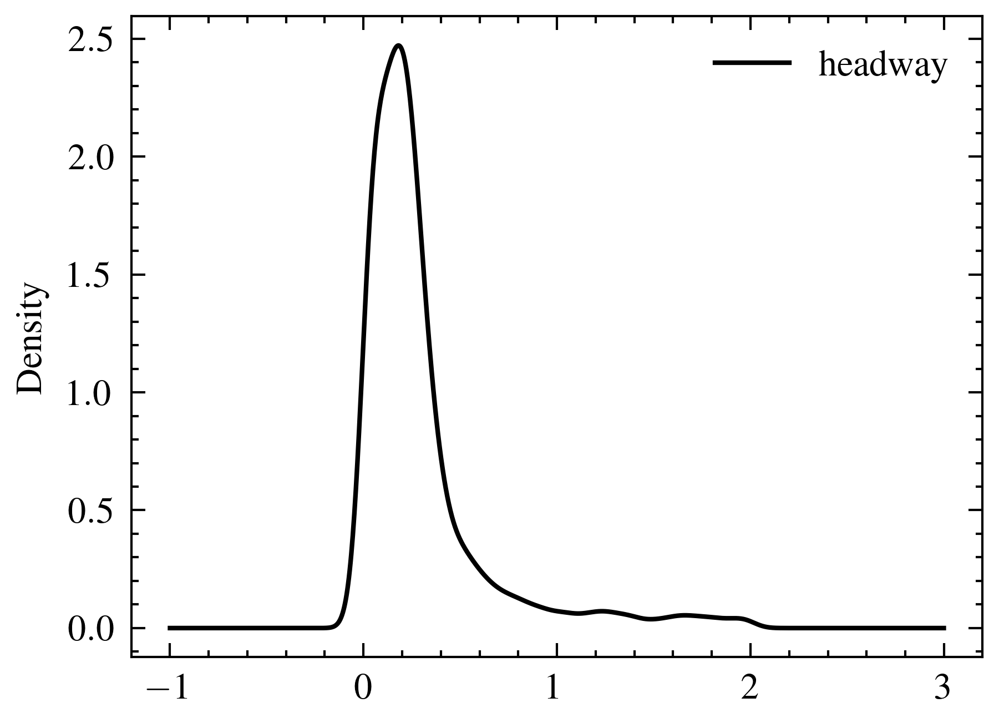

In [41]:
# plot a kde of headways
assoc1_df.filter(pl.col("headway").is_between(0, 2))[["headway"]].to_pandas().plot.kde()

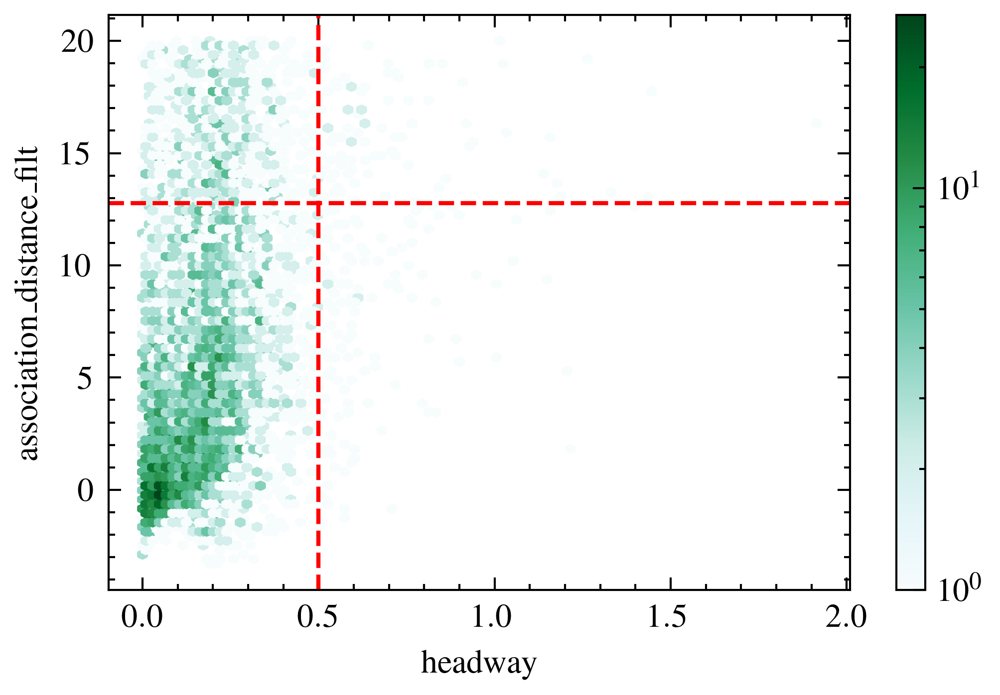

In [42]:
# # scatter plot the association distance vs the headway
# fig, ax = plt.subplots(figsize=(4, 2.5))

# assoc1_df.filter(pl.col("headway").is_between(-10, 20))[
#     ["headway", "association_distance_filt"]
# ].sample(10_000).to_pandas().plot.contour(x="headway", y="association_distance_filt", alpha=0.01, ax=ax)


# make a contour plot of the association distance vs the headway
import matplotlib


fig, ax = plt.subplots(figsize=(4, 2.5))

assoc1_df.filter(
    pl.col("headway").is_between(0, 20)
    & pl.col("association_distance_filt").is_between(-10, 20)
)[["headway", "association_distance_filt"]].to_pandas().plot.hexbin(
    x="headway",
    y="association_distance_filt",
    ax=ax,
    gridsize=100,
    norm=matplotlib.colors.LogNorm()
)



# add a horizontal line at the 95th percentile of the chi squared distribution
ax.axhline(chi2.ppf(0.9875, dims), color="r", linestyle="--")

# # set the y axis range
# ax.set_ylim(-5, 10)

# add a vertical line at headway cutoff of 0.5
ax.axvline(0.5, color="r", linestyle="--")

In [43]:
match_df = (
    assoc1_df.lazy()
    .pipe(
        build_match_df,
        traj_time_df=joined_df.group_by("object_id")
        .agg(
            pl.col("epoch_time").max().alias("epoch_time_max"),
        )
        .lazy(),
        assoc_cutoff=chi2.ppf(0.9875, dims),
        assoc_cutoff_pred=chi2.ppf(0.9875, dims),
        time_headway_cutoff=0.5,
    )
    .collect(streaming=True)
)


# 1 - 0.99

function: lazy_func took: 0.11173892021179199 seconds


In [44]:
dims

4

In [45]:
# joined_df.select(pl.col("P").arr.to_list().list.max())["P"].describe()

In [46]:
# # this is stupid
# # if "assoc_df" in globals():
# objs = assoc_df.filter(pl.col("vehicle_id").is_in([47382,]))[
#     "object_id"
# ]  # noqa: F821

# lf_df.filter(pl.col("object_id").is_in(objs) | pl.col("leader").is_in(objs)).filter(
#     pl.col("epoch_time").dt.second() == 11
# ).with_columns(
#             [
#                 # ----------- Calculate the Time Headway ------------
#                 ((pl.col("s_leader") - pl.col("s")) / pl.col("s_velocity")).alias(
#                     "headway"
#                 ),
#                 # -------- Calculate the Match Indexes Take 2 ------------
#                 # Find periods where there is no prediction
#                 # prediction naturally has more uncertainty
#                 # ---------------------------
#                 # find the start index to take
#                 # pl.col("object_id").cumcount().over("pair").alias("sort_index"),
#                 # find the end index to use
#             ]
#         )

### Re-Label the Joined Trajectories


In [47]:
from src.pipelines.association import create_vehicle_ids

assoc_df = joined_df.pipe(
    create_vehicle_ids,
    match_df,
)

function: lazy_func took: 0.1444556713104248 seconds


In [48]:
# ( assoc_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).sort('epoch_time_cst').filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-03-13 11:48:54").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-03-13 11:50:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (pl.col("lane_index") == 0)
#         & (pl.col("prediction") )
#     ))

In [49]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# 2023-03-12 21:42:21.100

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone)
    # .sort("epoch_time_cst")
    .filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-03-12 17:30:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-03-12 17:36:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("W"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="s",
    markers=True,
    fig=fig,
    # every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.00036334991455078125 seconds


In [50]:
# (
#     lf_df
#     .pipe(calculate_match_indexes, match_time_threshold=100)
#     .pipe(
#         pipe_gate_headway_calc, alpha=0.9
#     )
#     .collect()
# )

In [51]:
def build_intermediate() -> None:
    return (
        lf_df.pipe(calculate_match_indexes, match_time_threshold=100)
        .pipe(pipe_gate_headway_calc, alpha=0.9)
        .unnest("pair")
    )

In [52]:
leader_id = 1948
follower_id = 2632


keep_ids = assoc_df.filter(pl.col("vehicle_id").is_in([follower_id]))[
    ["vehicle_id", "object_id"]
].unique()

keep_follower_ids = keep_ids["object_id"].unique()
keep_leader_ids = assoc_df.filter(pl.col("vehicle_id").is_in([leader_id]))[
    "object_id"
].unique()

stats_df = (
    build_intermediate()
    .filter(
        pl.col("leader").is_in(keep_leader_ids)
        & pl.col("object_id").is_in(keep_follower_ids)
    )
    .collect()
)

plot_df = lf_df.filter(
    pl.col("object_id").is_in(keep_follower_ids)
    & pl.col("leader").is_in(keep_leader_ids)
).with_columns(
    ((pl.col("s_leader") - pl.col("s")) / pl.col("s_velocity")).alias("headway")
)

# plot the association_distance and s using plotly
from plotly.subplots import make_subplots

fig = make_subplots(
    # two y axis
    specs=[[{"secondary_y": True}]]
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["association_distance"],
        mode="lines+markers",
        name="Association Distance",
        line=dict(color="blue"),
    ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["association_distance"].ewm_mean(alpha=0.1),
        mode="lines+markers",
        name="Association Distance - EWM",
        line=dict(color="purple"),
    ),
    secondary_y=False,
)


fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["headway"],
        mode="lines+markers",
        name="headway",
        line=dict(color="yellow"),
    ),
    secondary_y=False,
)


fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["s"],
        mode="lines+markers",
        name="s",
        line=dict(color="red"),
    ),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["s_leader"],
        mode="lines+markers",
        name="s_leader",
        line=dict(color="green"),
    ),
    secondary_y=True,
)

function: lazy_func took: 0.001262664794921875 seconds
function: lazy_func took: 0.0001652240753173828 seconds


In [53]:
stats_df

leader,object_id,association_distance_filt,epoch_time,prediction,prediction_leader,headway,leader_s,s
u64,u64,f32,"datetime[ms, UTC]",bool,bool,f32,f32,f32


In [54]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     assoc_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:09:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:13:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="vehicle_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
#     every=2,
# )

# fig.update_layout(yaxis_autorange="reversed")


# fig.show()

In [55]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     assoc_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:03:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:05:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="vehicle_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
#     every=1,
# )

# # plot_time_space(
# #     plot_df.filter(
# #         pl.col('vehicle_id').is_in([6105, 1435])
# #     ),
# #     hoverdata="object_id",
# #     vehicle_col="vehicle_id",
# #     s_col="front_s",
# #     color_func=lambda *_: "black",
# #     markers=True,
# #     fig=fig,
# #     every=1,

# # )

# fig.update_layout(yaxis_autorange="reversed")


# fig.show()

In [56]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     joined_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:09:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:12:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (~pl.col("prediction"))
#         # & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

## Fuse & Smooth the Trajectories


In [57]:
# assoc_df.filter(
#     pl.col('vehicle_id').is_in([518, ])
# ).with_columns(
#     pl.count().over('epoch_time').alias('count')
# ).filter(
#     (pl.col('count') > 1)
# ).sort(
#     ['epoch_time', 'ip']
# ).with_c

In [58]:
from src.pipelines.association import build_fusion_df

fusion_df = (
    assoc_df
    # .filter(
    #     pl.col('vehicle_id').is_in([518, 777])
    # )
    .pipe(build_fusion_df, prediction_length=prediction_length, max_vehicle_num=3)
    .collect(streaming=True)
    .pipe(
        radar_obj.add_cst_timezone,
        time_col="epoch_time",
    )
)
# fusion_df.head()

function: lazy_func took: 3.5273563861846924 seconds
function: add_cst_timezone took: 0.0003955364227294922 seconds


In [59]:
# fusion_df.group_by(["vehicle_id", "time_index"]).agg(
#     pl.col("back_s").diff(),
#     pl.col("front_s").diff(),
#     pl.col("s").diff(),
# ).explode(["back_s", "front_s", "s"]).filter(pl.col("back_s").is_not_null())

In [60]:
distance_adjuster = (
    fusion_df.group_by(
        [
            "vehicle_id",
            "time_index",
        ]
    )
    .agg(
        pl.col("distanceToFront_s")
        .filter(pl.col("approaching"))
        .mean()
        .alias("distanceToFront_s"),
        pl.col("distanceToBack_s")
        .filter(~pl.col("approaching"))
        .mean()
        .alias("distanceToBack_s"),
        pl.col("distanceToFront_s").mean().alias("distanceToFront_s_all"),
        pl.col("distanceToBack_s").mean().alias("distanceToBack_s_all"),
    )
    .with_columns(
        pl.when(pl.col("distanceToFront_s").is_null())
        .then(pl.col("distanceToFront_s_all"))
        .otherwise(pl.col("distanceToFront_s"))
        .alias("distanceToFront_s"),
        pl.when(pl.col("distanceToBack_s").is_null())
        .then(pl.col("distanceToBack_s_all"))
        .otherwise(pl.col("distanceToBack_s"))
        .alias("distanceToBack_s"),
    )
    .drop(["distanceToFront_s_all", "distanceToBack_s_all"])
)

In [61]:
outer_df = (
    fusion_df.select(
        [
            "front_s",
            "s",
            "back_s",
            "s_velocity",
            "d",
            "d_velocity",
            "P",
            "vehicle_id",
            "time_index",
            "vehicle_time_index_int",
            "prediction",
            "length_s",
        ]
    )
    .lazy()
    .filter(~pl.col("prediction"))
)

outer_df = (
    (
        outer_df.join(
            outer_df,
            on=["time_index", "vehicle_id"],
            how="outer",
            suffix="_leader",
        )
    )
    .with_columns(
        pl.struct(
            [
                pl.min_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("one"),
                pl.max_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("two"),
            ]
        ).alias("vehicle_time_struct"),
    )
    # .collect()
    .filter(
        (
            pl.col("vehicle_time_index_int")
            .cum_count()
            .over(["vehicle_id", "time_index", "vehicle_time_struct"])
            < 1
        )
        & (pl.col("vehicle_time_index_int") != pl.col("vehicle_time_index_int_leader"))
    )
    .collect(streaming=True)
    .pipe(
        calc_assoc_liklihood_distance,
        gpu=GPU,
        dims=2,
    )
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("association_distance").max())
)

function: lazy_func took: 1.014864206314087 seconds


In [62]:
prediction_tracker = (
    fusion_df.select(
        [
            "vehicle_id",
            "time_index",
            # "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("prediction").all().alias("prediction"))
    .collect()
)

In [63]:
# np.median(
#     fusion_df.filter(pl.col("P_CALC").arr.to_list().list.first().is_not_nan())["P_CALC"]
#     .to_numpy()
#     .reshape(-1, 6, 6),
#     axis=0,
# ).max()

In [64]:
# fusion_df = (
#     fusion_df.lazy()
#     .join(
#         fusion_df.lazy()
#         .sort("epoch_time")
#         .filter(~pl.col('prediction'))
#         .group_by("vehicle_id")
#         .agg(pl.col("P_CALC").first().alias("last_P")),
#         on="vehicle_id",
#     )
#     .with_columns(pl.col(["last_P", "P_CALC"]).arr.to_list())
#     .with_columns(
#         pl.when(pl.col("prediction"))
#         .then(pl.col("last_P"))
#         .otherwise(pl.col("P_CALC"))
#         .alias("P_CALC")
#     )
#     .with_columns(pl.col("P_CALC").list.to_array(36))
#     .collect()
# )

In [65]:
from src.filters.fusion import batch_join, rts_smooth

GPU = True

# errrrrr

# v = fusion_df["P"].to_numpy(writable=True)
# v[:, 0] += fusion_df["length_s"].to_numpy() / 4

# fusion_df = fusion_df.with_columns(
#     P=v,
# ).with_columns(pl.col("P").list.to_array(width=36))

merged_df = batch_join(
    fusion_df,
    method="ImprovedFastCI",
    batch_size=10_000 if not GPU else 8_000,
    gpu=GPU,
    s_col="front_s",
)

100%|██████████| 1566/1566 [00:15<00:00, 103.32it/s]


In [66]:
merged_df = rts_smooth(
    merged_df, batch_size=10_000 if not GPU else 15_000, gpu=GPU, s_col="front_s"
)

/home/max/Development/roadside-radar/src/filters/fusion.py:1035: UserWarning:

The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)

100%|██████████| 1566/1566 [00:04<00:00, 387.71it/s]


In [67]:
merged_df = (
    merged_df.lazy()
    .join(
        fusion_df.lazy()
        .select(["time_index", "vehicle_id", "object_id", "length_s"])
        .group_by(["time_index", "vehicle_id"])
        .agg(pl.col("object_id"), pl.col("length_s").mean()),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        outer_df.lazy().select(["time_index", "vehicle_id", "association_distance"]),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        distance_adjuster.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .join(
        prediction_tracker.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .with_columns(
        # (pl.col("ci_s") + pl.col("distanceToFront_s")).alias("ci_front_s"),
        # (pl.col("ci_s") + pl.col("distanceToBack_s")).alias("ci_back_s"),
        # (pl.col("s_smooth") + pl.col("distanceToFront_s")).alias("front_s_smooth"),
        # (pl.col("s_smooth") + pl.col("distanceToBack_s")).alias("back_s_smooth"),
        (pl.col("ci_front_s") - pl.col("length_s")).alias("ci_back_s"),
        (pl.col("ci_front_s") - pl.col("distanceToFront_s")).alias("ci_s"),
        (pl.col("front_s_smooth") - pl.col("length_s")).alias("back_s_smooth"),
        (pl.col("front_s_smooth") - pl.col("distanceToFront_s")).alias("s_smooth"),
    )
    .collect()
)

In [68]:
# merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone).head()

In [69]:
from src.plotting.single_veh import plot_vehicle

# 2370	22	2.326786	0.303536	"1"
# 1227	22	6.57618	1.667884	"1"
# 1209
vehs = [
    # 440
    # 4766,
    1580,
    # 4791
    # 3845
    # 101,
    # 1098,
]

fig = None

for veh in vehs:
    ind_vehicles = (
        fusion_df.filter(pl.col("vehicle_id") == veh)["object_id"].unique().to_list()
    )

    fig = plot_vehicle(
        fusion_df.filter(pl.col("vehicle_id") == veh),
        s_velocity_col="s_velocity",
        s_col="front_s",
        fig=fig,
        data_name="IMM Filtered",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="s_smooth",
        s_velocity_col="s_velocity_smooth",
        # s_velocity_col="ci_s_velocity",
        d_col="d_smooth",
        d_velocity_col="d_velocity_smooth",
        fig=fig,
        color="blue",
        data_name="Fused and Smoothed",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="ci_s",
        s_velocity_col="ci_s_velocity",
        # s_velocity_col="ci_s_velocity",
        d_col="ci_d",
        d_velocity_col="ci_d_velocity",
        fig=fig,
        color="purple",
        data_name="CI Fused",
    )

    plot_vehicle(
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        ).pipe(
            radar_obj.add_cst_timezone,
        ),
        # s_col="front_s",
        # s_velocity_col="s_velocity",
        d_col="d",
        # d_velocity_col="d_velocity",
        fig=fig,
        color="black",
        data_name="Radar Raw",
    )

    # add a plot of the position differentiated
    _diff_df = (
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        )
        .pipe(
            radar_obj.add_cst_timezone,
        )
        .with_columns(
            (
                pl.col("s").diff()
                / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
            )
            .rolling_mean(center=True, window_size=50)
            .alias("diff_v")
        )
    )

    fig.add_trace(
        go.Scatter(
            x=_diff_df["epoch_time_cst"].cast(str),
            y=_diff_df["diff_v"],
            mode="lines",
            name="Radar Velocity",
            line=dict(color="black", width=2),
            yaxis="y2",
        )
    )


fig.update_layout(
    # use journal paper font
    font_family="Times New Roman",
    # set the font size
    font_size=22,
    # update the subplot titles
    title_font_family="Times New Roman",
    title_font_size=44,
    # set the x_limit
    yaxis=dict(
        title="S Distance [m]",
    ),
    yaxis2=dict(
        title="S Velocity [m/s]",
    ),
    yaxis3=dict(
        title="D Distance [m/s]",
    ),
    yaxis4=dict(
        title="D Velocity [m/s]",
    ),
    # set the size of the figure
    width=1000,
    height=600,
    template="ggplot2",
    # set the margin to reduce the whitespace
    margin=dict(l=0, r=0, t=0, b=0),
    # put the legend on the bottom
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(
            # family="Times New Roman",
            size=22,
        ),
    ),
)

function: add_cst_timezone took: 0.00014352798461914062 seconds
function: add_cst_timezone took: 0.00014734268188476562 seconds
function: add_cst_timezone took: 0.00021791458129882812 seconds
function: add_cst_timezone took: 0.00021529197692871094 seconds


In [55]:
import numpy as np
from scipy.signal import butter, sosfiltfilt
from scipy.integrate import cumtrapz


def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    sos = butter(order, normal_cutoff, btype="low", analog=False, output="sos")
    return sos


sos = butter_lowpass(0.25, 1 / 0.1, order=5)


def butter_lowpass_filter(data, cutoff, fs, order=5):
    # normalize data
    # max_val = np.max(data)
    # data = data / max_val
    # b, a = butter_lowpass(cutoff, fs, order=order)
    return sosfiltfilt(
        sos,
        data,
    )


fig = plot_vehicle(
    fusion_df.filter(pl.col("vehicle_id") == veh),
    s_velocity_col="s_velocity",
    s_col="s",
    # fig=fig,
    data_name="IMM Filtered",
    show_d=False,
)


# add a plot of the position differentiated
_diff_df = (
    radar_df.filter(
        pl.col("object_id").is_in(
            assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
        )
        & ~pl.col("prediction")
    )
    .pipe(
        radar_obj.add_cst_timezone,
    )
    .sort("epoch_time")
    .with_columns(
        (
            (pl.col("utm_x").diff() ** 2 + pl.col("utm_y").diff() ** 2).sqrt()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .rolling_mean(center=True, window_size=10)
        .over("object_id")
        .alias("diff_v"),
        (
            pl.col("s").diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .rolling_mean(center=True, window_size=5)
        .over("object_id")
        .alias("diff_s_v"),
        (
            pl.col("s").diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .backward_fill(1)
        .map_elements(
            lambda x: pl.Series(
                values=butter_lowpass_filter(
                    x.to_numpy(), cutoff=0.25, fs=1 / 0.1, order=5
                ),
                name="diff_s_v_smooth",
            )
        )
        .over("object_id")
        .alias("diff_s_v_smooth"),
        (
            pl.col("s")
            .map_elements(
                lambda x: pl.Series(
                    values=butter_lowpass_filter(
                        x.to_numpy(), cutoff=0.25, fs=1 / 0.1, order=6
                    ),
                    # name="diff_s_v_smooth",
                )
            )
            .diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .over("object_id")
        .alias("diff_smooth_s_v"),
    )
    .with_columns(
        (
            pl.col("diff_s_v_smooth").map_elements(
                lambda x: pl.Series(
                    values=cumtrapz(x.to_numpy(), dx=0.1, initial=0),
                )
            )
            + pl.col("s").first()
        )
        .over("object_id")
        .alias("diff_s_v_smooth_int"),
    )
)


fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_v"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="black", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="blue", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v_smooth"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="purple", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v_smooth_int"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="green", width=2),
        yaxis="y1",
    )
)

function: add_cst_timezone took: 0.00013637542724609375 seconds


## Save the File

In [58]:
from src.filters.vectorized_kalman import CALCFilter

print(CALCFilter.w_s)

2


In [54]:
# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s_smooth", "d_smooth", "front_x_smooth", "front_y_smooth"),
    ("back_s_smooth", "d_smooth", "back_x_smooth", "back_y_smooth"),
    ("s_smooth", "d_smooth", "centroid_x_smooth", "centroid_y_smooth"),
    ("ci_front_s", "ci_d", "ci_front_x", "ci_front_y"),
    ("ci_back_s", "ci_d", "ci_back_x", "ci_back_y"),
    ("ci_s", "ci_d", "ci_centroid_x", "ci_centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    merged_df = (
        merged_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )